## Capstone: Fast Food Franchise Strategic Placement in Bandung City, West Java, Indonesia
##### By Muhammad Ariqleesta Hidayat<br/>
LinkedIn: https://www.linkedin.com/in/ariqleesta/ <br/>
Github: https://github.com/ariqleesta/<br/>

### Table of contents
* [Introduction: Business Problem](#introduction)
* [Data Requirements](#data)
* [Methodology](#methodology)
* [Analysis](#analysis)
* [Results and Discussion](#results)
* [Conclusion](#conclusion)

### Introduction: Business Problem <a name="introduction"></a>

Owning a fast food franchise is one of the best choice for living with a promising income. Not only does the owner not need to pivot around advertising and marketing, but also to forgo the need of product development and quality control. However, it can be a costly venture. Let's say McDonalds. In Indonesia, you must have at least Rp 14,500,000,000 (equivalent to $ 1,000,000) (**harga segini lu udah bisa beli bakso se kabupaten**). Because the cost are unimaginably high, we need to consider a strategic placement for our franchise in order to get the best possible outcome that leads to the optimum amount of profit.

#### 1. Problem Description:
Where would be the best place in Bandung, Indonesia to start a fast food franchise considering the socio-demographic and happiness index data of the population in districts?

#### 2. Requirements:

This project will adapt the following requirements:
1. The franchise needs to be located in the middle of a concentrated area (denser population, culinary area, great in land use and support daily activity)
2. The franchise needs to be located in the sub-districts that have large amount of social interactions and daily activities based on socio-demographic and happiness data
3. In order to segment the sub-districts, it is needed to perform clustering based on the specifications above.

Franchises those will be my main focus are:
1. McDonald's
2. KFC
3. Burger King
4. Pizza Hut
5. Domino's Pizza

### Data Requirements: <a name="data"></a>


#### 1. Urban Data Postal Code
The postal code data is needed to identify each region in Kota Bandung. In Indonesia, every sub-district in the city have at least 1 postal code (it can be more than that). We can do further analysis and help us to specify which region belongs to each other.

csv source:
https://kodeposku.com/kodepos.csv

#### 2. Sub-District Population Data
This data will be used to determine how impactful is the sub-district toward the growth of franchise. This data contains 3 columns, they are population, density, and sub-district area. With this data, we can clearly see the distribution of population in Bandung city in contras of sub-districs in Kota Bandung.

csv source:
http://data.bandung.go.id/dataset/79261e57-18fd-4d53-859e-971231f098d3/resource/498da194-30b0-4f55-8ddf-930e0d9c6953/download/tahun-2020-s1---jumlah-kepadatan-penduduk.csv

#### 3. Urban District GeoJSON Data
This data contains the boundaries of administrative area for each sub-district. This data is needed to classify franchises based on their sub-district by looking its point inside which sub-district area. This data is also further needed to see how many franchises are located in a certain area of sub-district.

csv source:
https://git.bandung.go.id/opendatabdg/databdg/raw/master/resources/625/b2c/3273-kota-bandung-level-kecamatan.json

#### 4. Fast Food Restaurant Venues Data
We need tu utilize **Foursquare API** to retrieve possible necessary features of fast food available in Bandung City. We will collect franchises data those will be our main focus. They are:
1. McDonald's
2. KFC
3. Burger King
4. Pizza Hut
5. Domino's Pizza
To gather this data. 

API: https://api.foursquare.com.

#### 5. Happiness Index Data
Happiness data index is useful to see the behavior of population in each district. Research shows that happiness impact productivity and having strong correlation with social interaction. Higher the social interaction, higher the purchasing power. 

csv source:
http://data.bandung.go.id/dataset/96badd37-30e6-4a1c-922f-d6e3ee0587f3/resource/6134811e-6d89-45c6-965d-f58477a0b281/download/ik-berdasarkan-aspek-dan-kecamatan-2018.csv

#### 6. Sub-District Population Sallary Related to Happiness Index Data
From here, we can get the data of average salary for each sub-district from extrapolating on Happiness Index Data.

csv source:
http://data.bandung.go.id/dataset/f934a63c-110f-4748-a099-1d0ce98bf3d4/resource/25f84b3f-9793-4f11-b79c-99924da66a35/download/ik-berdasarkan-pendapatan-rumah-tangga-2018.csv


### Methodology <a name="methodology"></a>

The objective of this analysis is to give the best possible locations to place fast food franchise based on the socio-demographic and spatial data we gather before. This analysis's purposes are to give information to the stakeholders who wants to place their fast food franchise and prevent them blindfoldedly making undesirable decisions. 

Before we can do further analysis, we want to have our data clean and completely integrated. This part will consists of combining all the data before until they become sufficient enough to be utilized for gaining useful insights and making prediction. After all the data are desirable to be utilized and far from flaws, then we continue to the analysis section. The analysis section has four main parts as follows:

Firstly, we will do basic exploratory data analysis. This section consists of gainning as much insights as possible by looking at the contributions of each features in our data. We will see how these features take part on other features. We will also see how these features are vary on each different area of sub-districts in Bandung City.


Secondly, we will start gathering the aforementioned fast food restaurants data using Foursquare API. This data consists of coordinates of the venues that will be used for spatial merging with our sub-district geo spatial data. 


thirdly, we will start making segments using agglomerative clustering hierarchical approach to find similiarity between sub-districts based on socio-demographic index and number of fast-food franchise in those area. This section is the most crucial part as it leads to our goal to suggest the stakeholders for the best location to start placing their franchises.


fourth, we will focus on evaluation. We will see how each cluster differs from each other. We will see which one is the best cluster that contains suitable sub-districts to set up our franchise. Then we can serve the results and draw conclusions.


### Analysis <a name="analysis"></a>

This section consists of data cleansing, exploratory data analysis, and clustering. 

#### Import library

In [668]:
#!pip install fuzzymatcher
#!pip install geopandas
#!conda install -c conda-forge folium=0.12.0 --yes
#!pip uninstall folium -y
#!pip install selenium
#!pip install ipywebrtc

In [676]:
# Environment
import os

# Random
import random
random.seed(2)

# Data Manipulation Tools
import pandas as pd
import numpy as np
from fuzzymatcher import link_table, fuzzy_left_join
import difflib 
import geopandas as gpd
pd.options.display.max_rows = 1000
pd.options.display.max_columns = 100


# tranforming json file into a pandas dataframe library
from pandas.io.json import json_normalize

# Data Visualization Tools
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import seaborn as sns
from colour import Color
%matplotlib inline
plt.style.use('bmh')

# libraries for displaying images
from IPython.display import HTML, Image 
from IPython.core.display import HTML 
from IPython.display import display
import selenium



# Location Modules
import folium
from geopy.geocoders import Nominatim

# Web Scraping Modules
import requests 
from bs4 import BeautifulSoup as bs

# Securing Credentials
import getpass

# Ignore Warnings
import warnings
warnings.filterwarnings("ignore")

#### Data Cleansing

In [469]:
postal_url = 'https://kodeposku.com/kodepos.csv'
sub_district_population_url = 'http://data.bandung.go.id/dataset/79261e57-18fd-4d53-859e-971231f098d3/resource/498da194-30b0-4f55-8ddf-930e0d9c6953/download/tahun-2020-s1---jumlah-kepadatan-penduduk.csv'
urban_geojson_url = r'https://git.bandung.go.id/opendatabdg/databdg/raw/master/resources/625/b2c/3273-kota-bandung-level-kecamatan.json'
happiness_index_url = 'http://data.bandung.go.id/dataset/a8ffe75d-767f-4f08-a237-c6a251d16d84/resource/3cf9a2a9-6496-4a33-bda0-3f265c4afdac/download/ik-berdasarkan-aspek-dan-kecamatan-2018.csv'
monthly_income_based_on_happiness_url = 'http://data.bandung.go.id/dataset/f934a63c-110f-4748-a099-1d0ce98bf3d4/resource/25f84b3f-9793-4f11-b79c-99924da66a35/download/ik-berdasarkan-pendapatan-rumah-tangga-2018.csv'


In [470]:
# Let's look at postal zip code data
post_df = pd.read_csv(postal_url)
post_df.head()

,province,city,district,urban,postal_code
0,Bali,Badung,Kuta Selatan,Ungasan,80361
1,Bali,Badung,Kuta,Tuban,80361
2,Bali,Badung,Kuta Utara,Tibubeneng,80361
3,Bali,Badung,Kuta Selatan,Tanjung Benoa,80361
4,Bali,Badung,Kuta,Legian,80361


Take only bandung city

In [471]:
# Take only Bandung city
post_df = post_df[post_df['city'] == 'Bandung'].reset_index(drop = True).rename(columns = {'district': 'sub_district'})
post_df = post_df[['sub_district', 'postal_code']]
print('Postal Code Data in Bandung has {} rows and {} columns'.format(post_df.shape[0], post_df.shape[1]))
post_df.head()

Postal Code Data in Bandung has 431 rows and 2 columns


,sub_district,postal_code
0,Ranca Bali,40973
1,Ciwidey,40973
2,Ranca Bali,40973
3,Ciwidey,40973
4,Ciwidey,40973


In [472]:
# Let's look at Bandung sub-districts population data
pop_df = pd.read_csv(sub_district_population_url)
pop_df.columns = ['sub_district', 'population', 'area (Ha)', 'density (pop/ha)']
pop_df.head()

,sub_district,population,area (Ha),density (pop/ha)
0,Andir,99378,422,235
1,Antapani,78817,422,187
2,Arcamanik,76913,759,101
3,Astana Anyar,74049,268,276
4,Babakan Ciparay,139374,707,197


In [473]:
# Let's take a look at Bandung happiness index data
hap_df = pd.read_csv(happiness_index_url)
hap_df.columns = ['sub_district', 'social_interaction', 'security', 'family_harmony', 'health', 'spare_time', 
                  'environment', 'occupation', 'income_happiness_index', 'education', 'religion', 'home and home facility']
hap_df.head()
# note that income columns is actually happiness index based on income

,sub_district,social_interaction,security,family_harmony,health,spare_time,environment,occupation,income_happiness_index,education,religion,home and home facility
0,Andir,77.41,82.22,83.04,81.93,78.22,82.15,75.48,73.70,74.59,91.56,78.52
1,Antapani,73.12,74.40,73.12,72.12,70.73,74.01,72.22,71.83,69.74,86.81,72.52
2,Arcamanik,76.40,77.09,79.50,74.91,73.08,77.78,74.23,71.94,71.25,95.53,74.46
3,Astanaanyar,75.91,79.83,80.21,77.59,75.72,80.49,73.02,73.95,72.64,95.80,76.28
4,Babakan Ciparay,72.57,72.20,76.59,72.68,69.27,74.85,69.70,67.97,68.08,87.26,72.03


In [474]:
# We are interesting in income index, how much average income for each sub-district
# Let's take a look at monthly income based on happiness index
inc_df = pd.read_csv(monthly_income_based_on_happiness_url)
inc_df.columns = ['monthly_income', 'income_happiness_index']
inc_df

,monthly_income,income_happiness_index
0,Hingga Rp 1.800.000,71.45
1,Rp 1.800.001 - Rp 3.000.000,75.28
2,Rp 3.000.001 - Rp 4.800.000,76.89
3,Rp 4.800.001 - Rp 7.200.000,77.92
4,> Rp 7.200.000,80.26


<AxesSubplot:xlabel='income_happiness_index', ylabel='Density'>

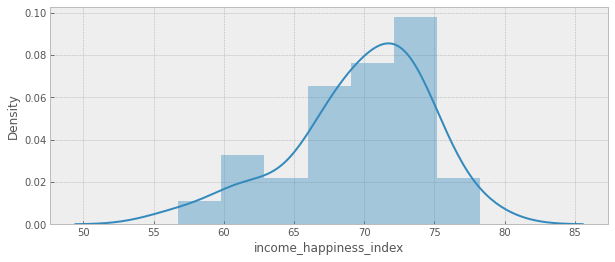

In [475]:
# We need to do interpolation to the happinex index data to get the average income for each district. 
# Before that, we need to see the distribution of income happiness index
plt.figure(figsize = (10,4))
sns.distplot(hap_df.income_happiness_index)


In [476]:
# We can see from distribution the minimum value of happiness index is approximately 50
# we need to center the monthly_income value with respect to income happiness index
inc_df['average_monthly_income (IDR)'] = [1800000, (1800001+3000000)/2,(3000001+4800000)/2,(4800001+7200000)/2,7200000]
inc_df

,monthly_income,income_happiness_index,average_monthly_income (IDR)
0,Hingga Rp 1.800.000,71.45,1800000.0
1,Rp 1.800.001 - Rp 3.000.000,75.28,2400000.5
2,Rp 3.000.001 - Rp 4.800.000,76.89,3900000.5
3,Rp 4.800.001 - Rp 7.200.000,77.92,6000000.5
4,> Rp 7.200.000,80.26,7200000.0


In [477]:
# Let's say the border for happiness index 50 is the one who got income below Rp 1,000,000.
# We need to add the low border just to make sure there are no income below 0.

inc_df.loc[5] = ['Below Rp 1.000.000', 50, 1000000/2]
inc_df

,monthly_income,income_happiness_index,average_monthly_income (IDR)
0,Hingga Rp 1.800.000,71.45,1800000.0
1,Rp 1.800.001 - Rp 3.000.000,75.28,2400000.5
2,Rp 3.000.001 - Rp 4.800.000,76.89,3900000.5
3,Rp 4.800.001 - Rp 7.200.000,77.92,6000000.5
4,> Rp 7.200.000,80.26,7200000.0
5,Below Rp 1.000.000,50.00,500000.0


In [478]:
# Now sort values based on happiness index
inc_df = inc_df.sort_values(by = 'income_happiness_index' )
inc_df

,monthly_income,income_happiness_index,average_monthly_income (IDR)
5,Below Rp 1.000.000,50.00,500000.0
0,Hingga Rp 1.800.000,71.45,1800000.0
1,Rp 1.800.001 - Rp 3.000.000,75.28,2400000.5
2,Rp 3.000.001 - Rp 4.800.000,76.89,3900000.5
3,Rp 4.800.001 - Rp 7.200.000,77.92,6000000.5
4,> Rp 7.200.000,80.26,7200000.0


Text(0.5, 0, 'Income Happiness Index')

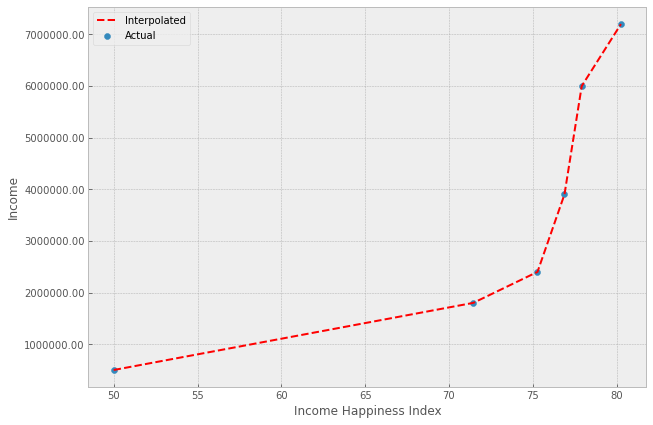

In [481]:
# Now let's interpolate
from scipy.interpolate import interp1d
from matplotlib.ticker import FormatStrFormatter

f1 = interp1d(x = inc_df.income_happiness_index, y = inc_df["average_monthly_income (IDR)"], kind = 'slinear', fill_value="extrapolate")

#let's plot the result
fig, ax = plt.subplots(figsize=(10, 7))

ax.scatter(inc_df.income_happiness_index, inc_df["average_monthly_income (IDR)"], label = 'Actual',)
ax.plot(inc_df.income_happiness_index, f1(inc_df.income_happiness_index),"--r", label = 'Interpolated',)

plt.gca().yaxis.set_major_formatter(FormatStrFormatter("%.2f"))

plt.legend()
plt.ylabel("Income")
plt.xlabel("Income Happiness Index")

In [482]:
# Now let's apply the interpolated function to the actual income happiness index
hap_df["average_monthly_income (IDR)"] = f1(hap_df["income_happiness_index"])
hap_df.head()

,sub_district,social_interaction,security,family_harmony,health,spare_time,environment,occupation,income_happiness_index,education,religion,home and home facility,average_monthly_income (IDR)
0,Andir,77.41,82.22,83.04,81.93,78.22,82.15,75.48,73.70,74.59,91.56,78.52,2.152481e+06
1,Antapani,73.12,74.40,73.12,72.12,70.73,74.01,72.22,71.83,69.74,86.81,72.52,1.859530e+06
2,Arcamanik,76.40,77.09,79.50,74.91,73.08,77.78,74.23,71.94,71.25,95.53,74.46,1.876762e+06
3,Astanaanyar,75.91,79.83,80.21,77.59,75.72,80.49,73.02,73.95,72.64,95.80,76.28,2.191645e+06
4,Babakan Ciparay,72.57,72.20,76.59,72.68,69.27,74.85,69.70,67.97,68.08,87.26,72.03,1.589091e+06


Text(0.5, 0, 'Income Happiness Index')

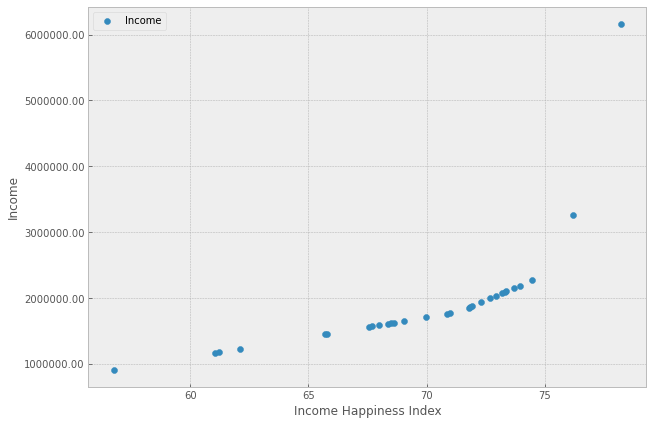

In [483]:
fig, ax = plt.subplots(figsize=(10, 7))

ax.scatter(hap_df["income_happiness_index"], hap_df["average_monthly_income (IDR)"], label = 'Income',)

plt.gca().yaxis.set_major_formatter(FormatStrFormatter("%.2f"))

plt.legend()

plt.ylabel("Income")
plt.xlabel("Income Happiness Index")

In [484]:
# Let's look at json geographical data for each sub-district
geojson = requests.get(urban_geojson_url).json()
geo_df = gpd.read_file(urban_geojson_url).rename(columns = {'KECAMATAN':'sub_district'})
geo_df.head(2)

,FID,OBJECTID,ID_DESA,DESA,sub_district,KABUPATEN,PROVINSI,ID_KEC,ID_KAB,ID_PROV,Shape_Leng,Shape_Area,Luas_Km_,geometry
0,4497,4498,3273050001,KARASAK,ASTANAANYAR,K_BANDUNG,JAWA BARAT,3273050,3273,32,3242.038689,296734.274305,0.296734,"POLYGON ((107.61179 -6.95562, 107.61177 -6.955..."
1,4548,4549,3273190001,ARJUNA,CICENDO,K_BANDUNG,JAWA BARAT,3273190,3273,32,3795.802670,798412.462832,0.798412,"POLYGON ((107.59810 -6.91432, 107.59799 -6.914..."


In [485]:
# Change to Lowercase
geo_df['sub_district'] = geo_df['sub_district']

In [486]:
## Now we need to combine all the dataframes into one
# But we need to look at all the shape of dataframes
post_df.shape

(431, 2)

In [487]:
pop_df.shape

(30, 4)

In [488]:
hap_df.shape

(30, 13)

In [489]:
geo_df.shape

(30, 14)

In [646]:
# They are true numbers, in Bandung we have 30 sub-districts. We need to combine all dataframes with fuzzy merge.
def fuzzy_merge(df1, df2, left_on, right_on, how='inner', cutoff=0.6):
    df_other= df2.copy()
    df_other[left_on] = [get_closest_match(x, df1[left_on], cutoff) 
                         for x in df_other[right_on]]
    return df1.merge(df_other, on=left_on, how=how)

def get_closest_match(x, other, cutoff):
    matches = difflib.get_close_matches(x, other, cutoff=cutoff)
    return matches[0] if matches else None

In [491]:
# Match population data and happiness data
df_1 = fuzzy_merge(pop_df, hap_df, 'sub_district', 'sub_district', cutoff = 0.8)#.drop(columns = 'matches', axis = 0)
df_1.shape

(30, 16)

In [492]:
# Match geo data and postal zip code data
df = fuzzy_merge(post_df.groupby(['sub_district'])['postal_code'].apply(list).to_frame().reset_index(), df_1, 'sub_district', 'sub_district', cutoff = 0.5)#.drop(columns = 'matches', axis = 0)
df['sub_district'] = df['sub_district'].str.upper()
df.shape

(30, 17)

In [493]:
 df.sub_district.sort_values().values, geo_df.sub_district.sort_values().values,

(array(['ANDIR', 'ARCAMANIK', 'ASTANA ANYAR', 'BABAKAN CIPARAY',
        'BANDUNG KIDUL', 'BANDUNG KULON', 'BANDUNG WETAN', 'BATUNUNGGAL',
        'BOJONGLOA KALER', 'BOJONGLOA KIDUL', 'BUAHBATU (MARGACINTA)',
        'CIBEUNYING KALER', 'CIBEUNYING KIDUL', 'CIBIRU', 'CICENDO',
        'CIDADAP', 'CINAMBO', 'COBLONG', 'GEDEBAGE', 'KATAPANG',
        'KIARACONDONG', 'LENGKONG', 'MANDALAJATI', 'PANYILEUKAN',
        'RANCASARI', 'REGOL', 'SUKAJADI', 'SUKASARI', 'SUMUR BANDUNG',
        'UJUNG BERUNG'], dtype=object),
 array(['ANDIR', 'ANTAPANI', 'ARCAMANIK', 'ASTANAANYAR', 'BABAKAN CIPARAY',
        'BANDUNG KIDUL', 'BANDUNG KULON', 'BANDUNG WETAN', 'BATUNUNGGAL',
        'BOJONGLOA KALER', 'BOJONGLOA KIDUL', 'BUAHBATU',
        'CIBEUNYING KALER', 'CIBEUNYING KIDUL', 'CIBIRU', 'CICENDO',
        'CIDADAP', 'CINAMBO', 'COBLONG', 'GEDEBAGE', 'KIARACONDONG',
        'LENGKONG', 'MANDALAJATI', 'PANYILEUKAN', 'RANCASARI', 'REGOL',
        'SUKAJADI', 'SUKASARI', 'SUMUR BANDUNG', 'UJUNG BERUN

In [495]:
df['sub_district'] = df['sub_district'].replace({'BUAHBATU (MARGACINTA)': 'BUAHBATU', 
                                                 'KATAPANG': 'ANTAPANI',
                                                 'ASTANA ANYAR' : 'ASTANAANYAR',
                                                })

#### Exploratory Data Analysis

In [651]:
print(df.shape)
df.head(2)

(30, 17)


,sub_district,postal_code,population,area (Ha),density (pop/ha),social_interaction,security,family_harmony,health,spare_time,environment,occupation,income_happiness_index,education,religion,home and home facility,average_monthly_income (IDR)
0,ANDIR,"[40184, 40184, 40184, 40182, 40183, 40181]",99378,422,235,77.41,82.22,83.04,81.93,78.22,82.15,75.48,73.70,74.59,91.56,78.52,2.152481e+06
1,ARCAMANIK,"[40294, 40293, 40293, 40293]",76913,759,101,76.40,77.09,79.50,74.91,73.08,77.78,74.23,71.94,71.25,95.53,74.46,1.876762e+06


In [652]:
print(geo_df.shape)
geo_df.head(2)

(30, 14)


,FID,OBJECTID,ID_DESA,DESA,sub_district,KABUPATEN,PROVINSI,ID_KEC,ID_KAB,ID_PROV,Shape_Leng,Shape_Area,Luas_Km_,geometry
0,4497,4498,3273050001,KARASAK,ASTANAANYAR,K_BANDUNG,JAWA BARAT,3273050,3273,32,3242.038689,296734.274305,0.296734,"POLYGON ((107.61179 -6.95562, 107.61177 -6.955..."
1,4548,4549,3273190001,ARJUNA,CICENDO,K_BANDUNG,JAWA BARAT,3273190,3273,32,3795.802670,798412.462832,0.798412,"POLYGON ((107.59810 -6.91432, 107.59799 -6.914..."


In [501]:
df.describe()

,population,area (Ha),density (pop/ha),social_interaction,security,family_harmony,health,spare_time,environment,occupation,income_happiness_index,education,religion,home and home facility,average_monthly_income (IDR)
count,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000,3.000000e+01
mean,83012.866667,568.266667,157.633333,73.670333,76.729000,76.929000,74.368333,72.869000,77.201667,72.824333,69.737000,69.940667,89.920667,72.648667,1.924775e+06
std,31212.647308,171.580067,76.467475,4.028697,3.631914,4.586977,4.095130,4.271331,3.449186,3.543175,4.820118,4.132775,5.050562,4.564424,9.087662e+05
min,25266.000000,268.000000,41.000000,63.890000,69.690000,62.800000,64.010000,64.250000,68.840000,63.290000,56.760000,60.630000,77.290000,61.840000,9.096970e+05
25%,70288.500000,434.750000,108.000000,71.940000,73.975000,75.217500,72.260000,69.492500,74.975000,71.097500,67.752500,66.777500,87.272500,71.362500,1.575909e+06
50%,79666.000000,536.500000,144.000000,74.055000,77.040000,77.535000,74.585000,73.205000,77.815000,73.500000,70.930000,70.305000,89.760000,72.525000,1.768485e+06
75%,101661.500000,699.500000,192.750000,76.422500,79.530000,79.687500,76.920000,75.605000,79.255000,74.930000,73.130000,72.722500,93.282500,75.660000,2.063186e+06
max,139374.000000,996.000000,396.000000,81.580000,84.070000,83.260000,81.930000,80.040000,85.640000,80.820000,78.230000,78.460000,99.560000,80.530000,6.158975e+06


In [502]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 30 entries, 0 to 29
Data columns (total 17 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   sub_district                  30 non-null     object 
 1   postal_code                   30 non-null     object 
 2   population                    30 non-null     int64  
 3   area (Ha)                     30 non-null     int64  
 4   density (pop/ha)              30 non-null     int64  
 5   social_interaction            30 non-null     float64
 6   security                      30 non-null     float64
 7   family_harmony                30 non-null     float64
 8   health                        30 non-null     float64
 9   spare_time                    30 non-null     float64
 10  environment                   30 non-null     float64
 11  occupation                    30 non-null     float64
 12  income_happiness_index        30 non-null     float64
 13  educati

<AxesSubplot:>

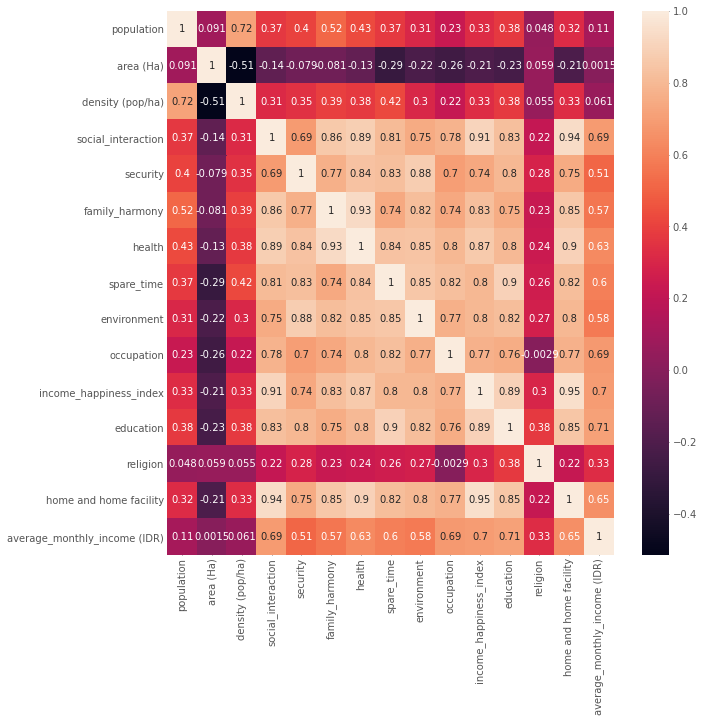

In [503]:
# Look at the heatmap
plt.figure(figsize = (10,10))
sns.heatmap(df.loc[:, df.dtypes != object].corr(), annot = True)

Text(0.5, 1.0, '\nAverage Monthly Income in Each Sub-District\n')

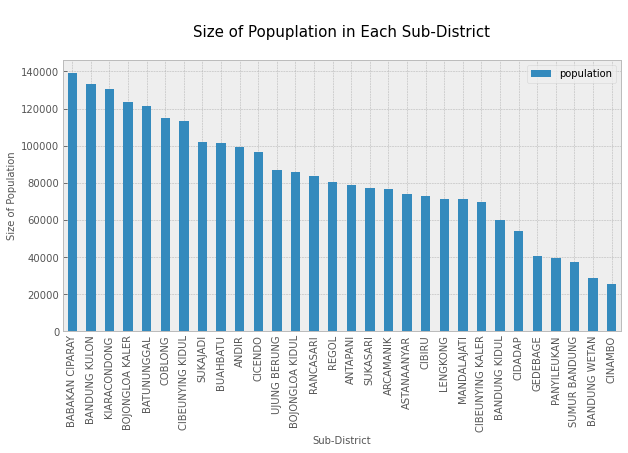

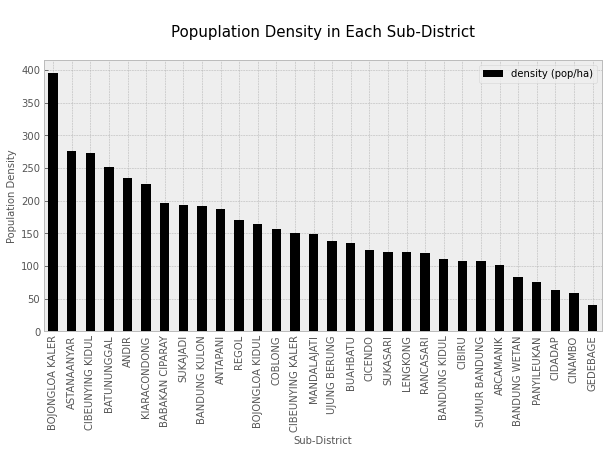

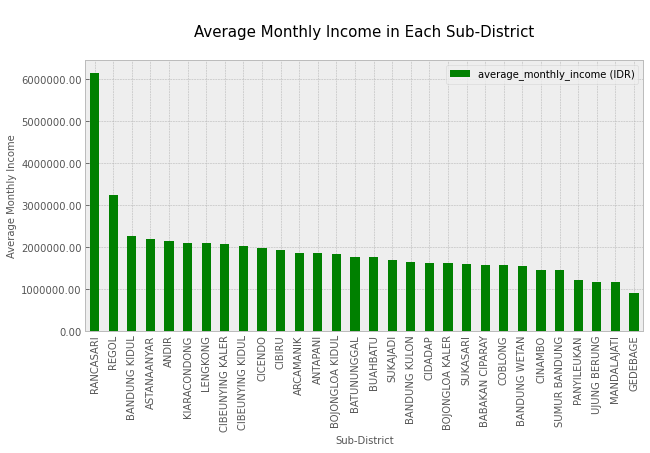

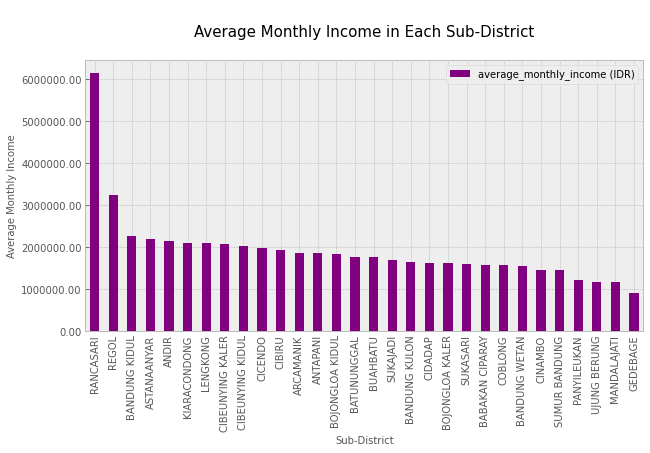

In [504]:
# We need to see which sub-district has higher and denser population and has higher income.

ax0 = df.sort_values('population', ascending = False).plot(kind='bar', x = 'sub_district', y = 'population', figsize = (10,5))
ax0.set_xlabel("Sub-District", size = 10)
ax0.set_ylabel("Size of Population", size = 10)
ax0.set_title("\nSize of Popuplation in Each Sub-District\n", size = 15)

ax1 = df.sort_values('density (pop/ha)', ascending = False).plot(kind='bar', x = 'sub_district', y = 'density (pop/ha)', figsize = (10,5), color = 'black')
ax1.set_xlabel("Sub-District", size = 10)
ax1.set_ylabel("Population Density", size = 10)
ax1.set_title("\nPopuplation Density in Each Sub-District\n", size = 15)

ax2 = df.sort_values('average_monthly_income (IDR)', ascending = False).plot(kind='bar', x = 'sub_district', y = 'average_monthly_income (IDR)', figsize = (10,5), color = 'green')
plt.gca().yaxis.set_major_formatter(FormatStrFormatter("%.2f"))
ax2.set_xlabel("Sub-District", size = 10)
ax2.set_ylabel("Average Monthly Income", size = 10)
ax2.set_title("\nAverage Monthly Income in Each Sub-District\n", size = 15)

ax2 = df.sort_values('average_monthly_income (IDR)', ascending = False).plot(kind='bar', x = 'sub_district', y = 'average_monthly_income (IDR)', figsize = (10,5), color = 'purple')
plt.gca().yaxis.set_major_formatter(FormatStrFormatter("%.2f"))
ax2.set_xlabel("Sub-District", size = 10)
ax2.set_ylabel("Average Monthly Income", size = 10)
ax2.set_title("\nAverage Monthly Income in Each Sub-District\n", size = 15)

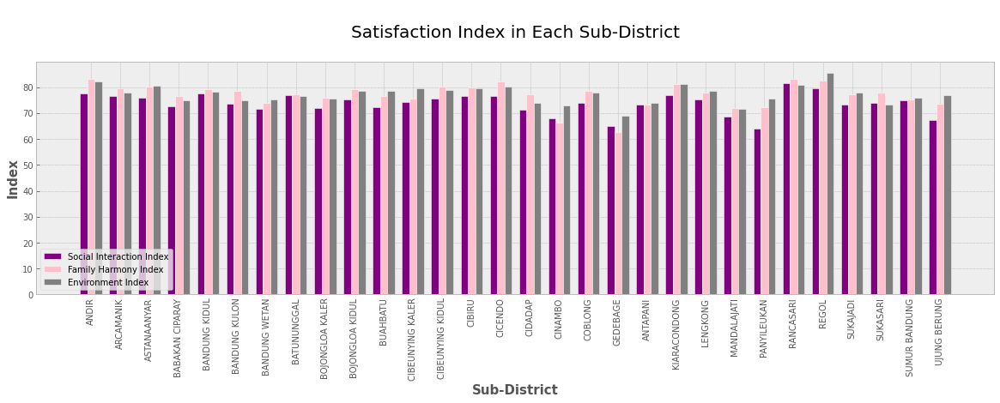

In [555]:
# now we need to see the happiness index for social interaction, family harmony, and environment

# set width of bar
barWidth = 0.25

plt.figure(figsize = (20,5))
 
# Set position of bar on X axis
r1 = np.arange(len(df))
r2 = [x + barWidth for x in r1]
r3 = [x + barWidth for x in r2]
 
# Make the plot
plt.bar(r1, df.social_interaction, color='purple', width=barWidth, edgecolor='white', label='Social Interaction Index')
plt.bar(r2, df.family_harmony, color='pink', width=barWidth, edgecolor='white', label='Family Harmony Index')
plt.bar(r3, df.environment, color='grey', width=barWidth, edgecolor='white', label='Environment Index')
 
# Add xticks on the middle of the group bars
plt.xlabel("Sub-District", size = 15, fontweight='bold')
plt.ylabel("Index", size = 15, fontweight='bold')
plt.title("\nSatisfaction Index in Each Sub-District\n", size = 20)
plt.xticks([r + barWidth for r in range(len(df))], df['sub_district'], rotation = 90)
 
# Create legend & Show graphic
plt.legend(loc = 3)
plt.show()



In [657]:
# Let's create choropleth for population for each district

# Determining the threshold scale
threshold_scale = np.linspace(df['population'].min(),
                              df['population'].max(),
                              6, dtype=int)
threshold_scale = threshold_scale.tolist()
threshold_scale[-1] = threshold_scale[-1] + 1 

# Create a map
m = folium.Map(location=[-6.9175, 107.6402], zoom_start=12)

# Add choropleth
folium.Choropleth(
    geo_data=geo_df,
    data=df[['sub_district', 'population']],
    columns=['sub_district', 'population'],
    key_on='feature.properties.sub_district',
    threshold_scale=threshold_scale,
    fill_color='YlGnBu', 
    fill_opacity=0.4, 
    line_opacity=0.2,
    legend_name='Bandung Sub-District Population',
    reset=True,
    highlight=True,
).add_to(m)

m

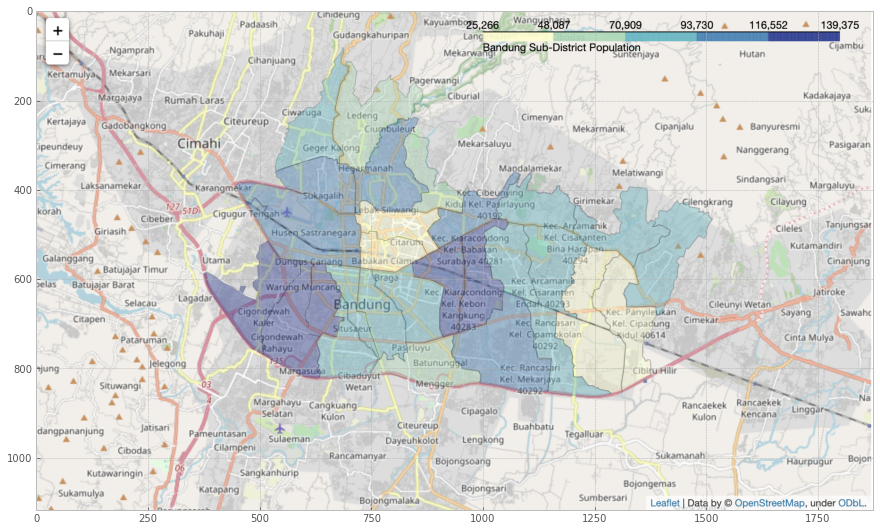

In [682]:
# Folium map won't render on github, so this is the png to see how the map looks like.
plt.figure(figsize=(15,15))
plt.imshow(mpimg.imread('pop_map.png'))

In [680]:
# Let's create choropleth for density for each district

# Determining the threshold scale
threshold_scale = np.linspace(df['density (pop/ha)'].min(),
                              df['density (pop/ha)'].max(),
                              6, dtype=int)
threshold_scale = threshold_scale.tolist()
threshold_scale[-1] = threshold_scale[-1] + 1 

# Create a map
m = folium.Map(location=[-6.9175, 107.6301], zoom_start=12)

# Add choropleth
folium.Choropleth(
    geo_data=geo_df,
    data=df[['sub_district', 'density (pop/ha)']],
    columns=['sub_district', 'density (pop/ha)'],
    key_on='feature.properties.sub_district',
    threshold_scale=threshold_scale,
    fill_color='YlOrRd', 
    fill_opacity=0.4, 
    line_opacity=0.2,
    legend_name='Bandung Sub-District Density',
    reset=True,
    highlight=True,
).add_to(m)

m

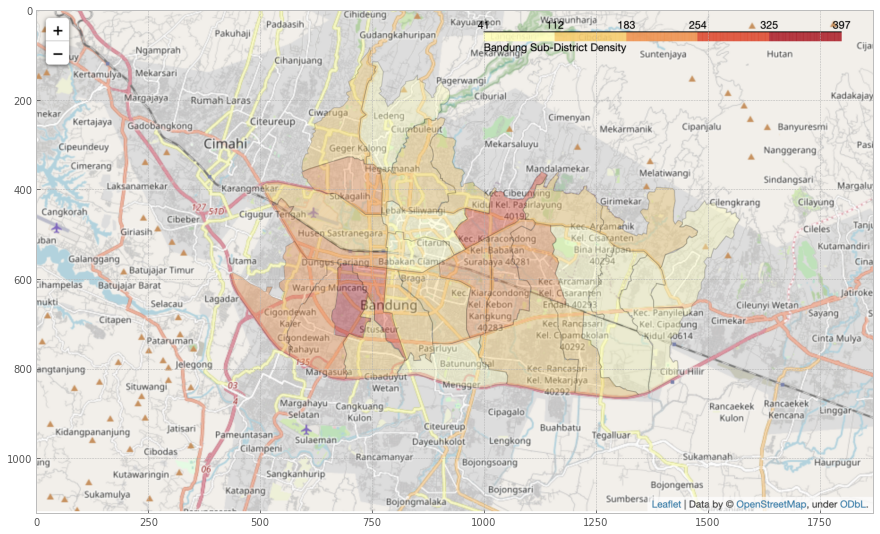

In [683]:
# Folium map won't render on github, so this is the png to see how the map looks like.
plt.figure(figsize=(15,15))
plt.imshow(mpimg.imread('density_map.png'))

In [508]:
# Let's create choropleth for average monthly income for each district

# Determining the threshold scale
threshold_scale = np.linspace(df['average_monthly_income (IDR)'].min(),
                              df['average_monthly_income (IDR)'].max(),
                              6, dtype=int)
threshold_scale = threshold_scale.tolist()
threshold_scale[-1] = threshold_scale[-1] + 1

# Create a map
m = folium.Map(location=[-6.9175, 107.6402], zoom_start=12)

# Add choropleth
folium.Choropleth(
    geo_data=geo_df,
    data=df[['sub_district', 'average_monthly_income (IDR)']],
    columns=['sub_district', 'average_monthly_income (IDR)'],
    key_on='feature.properties.sub_district',
    threshold_scale=threshold_scale,
    fill_color='YlGnBu', 
    fill_opacity=0.7, 
    line_opacity=0.2,
    legend_name='Bandung Sub-District Average Monthly Income (IDR)',
    reset=True,
    highlight=True,
).add_to(m)

m

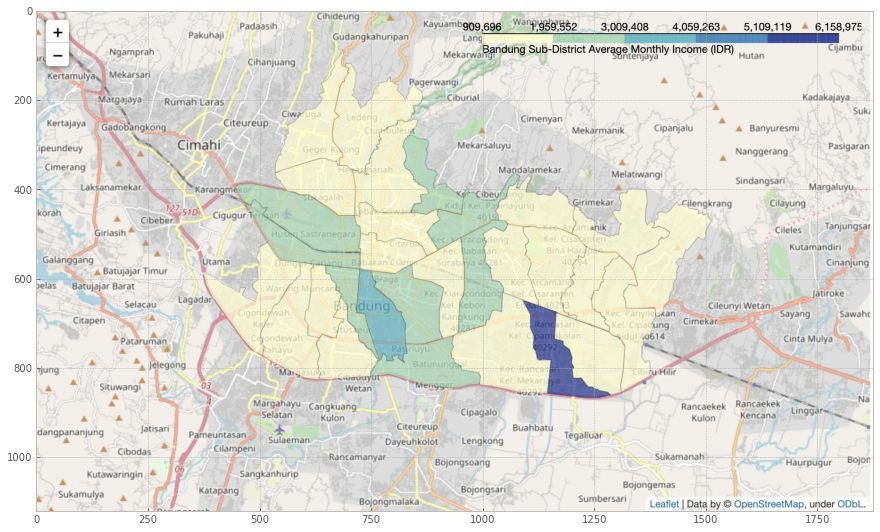

In [684]:
# Folium map won't render on github, so this is the png to see how the map looks like.
plt.figure(figsize=(15,15))
plt.imshow(mpimg.imread('income_map.png'))

In [509]:
# Let's create choropleth for social interaction for each district

# Determining the threshold scale
threshold_scale = np.linspace(df['social_interaction'].min(),
                              df['social_interaction'].max(),
                              6, dtype=int)
threshold_scale = threshold_scale.tolist()
threshold_scale[-1] = threshold_scale[-1] + 1

# Create a map
m = folium.Map(location=[-6.9175, 107.6402], zoom_start=12)

# Add choropleth
folium.Choropleth(
    geo_data=geo_df,
    data=df[['sub_district', 'social_interaction']],
    columns=['sub_district', 'social_interaction'],
    key_on='feature.properties.sub_district',
    threshold_scale=threshold_scale,
    fill_color='Purples', 
    fill_opacity=0.7, 
    line_opacity=0.2,
    legend_name='Bandung Sub-District Social Interaction Index',
    reset=True,
    highlight=True,
).add_to(m)

m

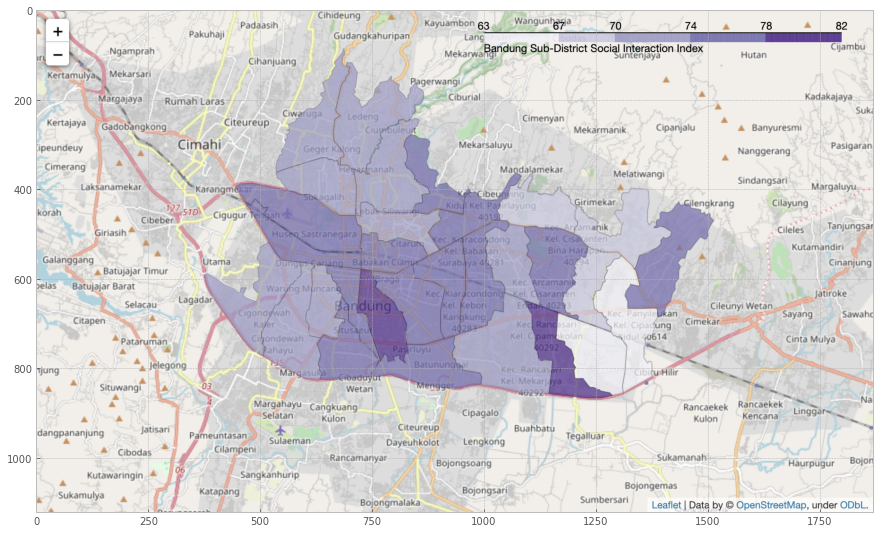

In [685]:
# Folium map won't render on github, so this is the png to see how the map looks like.
plt.figure(figsize=(15,15))
plt.imshow(mpimg.imread('social_interaction_map.png'))

In [686]:
# Let's create choropleth for environment for each district

# Determining the threshold scale
threshold_scale = np.linspace(df['environment'].min(),
                              df['environment'].max(),
                              6, dtype=int)
threshold_scale = threshold_scale.tolist()
threshold_scale[-1] = threshold_scale[-1] + 1

# Create a map
m = folium.Map(location=[-6.9175, 107.6402], zoom_start=12)

# Add choropleth
folium.Choropleth(
    geo_data=geo_df,
    data=df[['sub_district', 'environment']],
    columns=['sub_district', 'environment'],
    key_on='feature.properties.sub_district',
    threshold_scale=threshold_scale,
    fill_color='Greens', 
    fill_opacity=0.7, 
    line_opacity=0.2,
    legend_name='Bandung Sub-District Environment Index',
    reset=True,
    highlight=True,
).add_to(m)

m

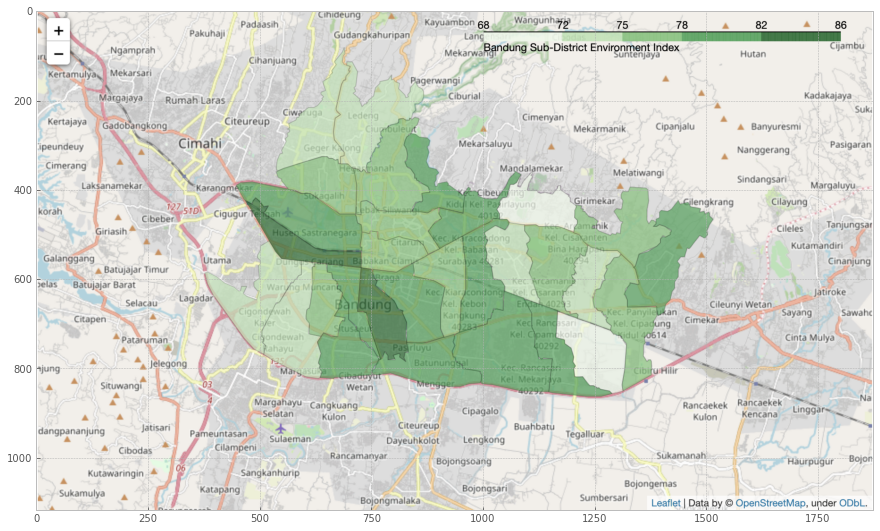

In [688]:
# Folium map won't render on github, so this is the png to see how the map looks like.
plt.figure(figsize=(15,15))
plt.imshow(mpimg.imread('environment_index_map.png'))

In [695]:
# Let's create choropleth for family harmony for each district

# Determining the threshold scale
threshold_scale = np.linspace(df['family_harmony'].min(),
                              df['family_harmony'].max(),
                              6, dtype=int)
threshold_scale = threshold_scale.tolist()
threshold_scale[-1] = threshold_scale[-1] + 1

# Create a map
m = folium.Map(location=[-6.9175, 107.6402], zoom_start=12)

# Add choropleth
folium.Choropleth(
    geo_data=geo_df,
    data=df[['sub_district', 'family_harmony']],
    columns=['sub_district', 'family_harmony'],
    key_on='feature.properties.sub_district',
    threshold_scale=threshold_scale,
    fill_color='YlGnBu', 
    fill_opacity=0.5, 
    line_opacity=0.2,
    legend_name='Bandung Sub-District Family Harmony Index',
    reset=True,
    highlight=True,
).add_to(m)

m

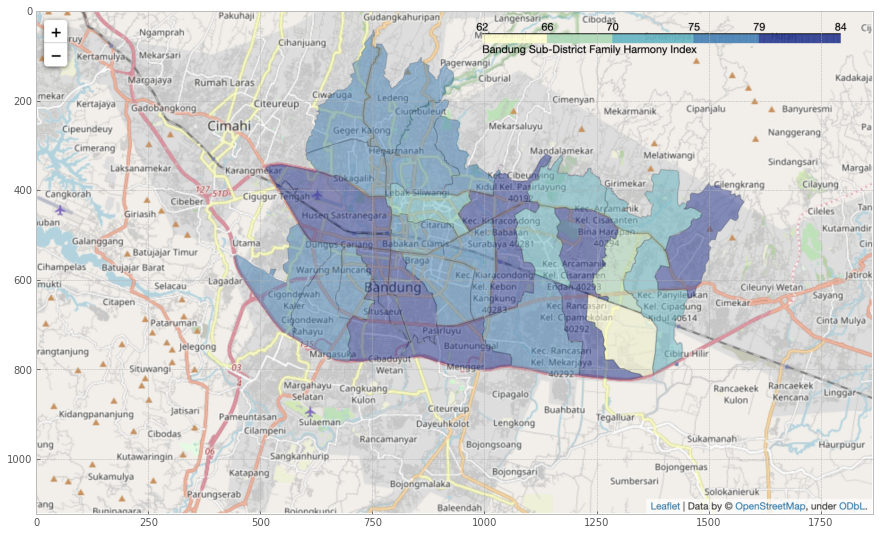

In [689]:
# Folium map won't render on github, so this is the png to see how the map looks like.
plt.figure(figsize=(15,15))
plt.imshow(mpimg.imread('family_harmony_map.png'))

#### Foursquare API

In [44]:
CLIENT_ID = getpass.getpass('Enter your Foursquare Client Id') # your Foursquare ID
CLIENT_SECRET = getpass.getpass('Enter your Foursquare Secret') # your Foursquare Secret
ACCESS_TOKEN = getpass.getpass('Enter your FourSquare Access Token') # your FourSquare Access Token
VERSION = '20180604'
LIMIT = 30


Enter your Foursquare Client Id ················································
Enter your Foursquare Secret ················································
Enter your FourSquare Access Token ················································


In [512]:
df.head()

,sub_district,postal_code,population,area (Ha),density (pop/ha),social_interaction,security,family_harmony,health,spare_time,environment,occupation,income_happiness_index,education,religion,home and home facility,average_monthly_income (IDR)
0,ANDIR,"[40184, 40184, 40184, 40182, 40183, 40181]",99378,422,235,77.41,82.22,83.04,81.93,78.22,82.15,75.48,73.70,74.59,91.56,78.52,2.152481e+06
1,ARCAMANIK,"[40294, 40293, 40293, 40293]",76913,759,101,76.40,77.09,79.50,74.91,73.08,77.78,74.23,71.94,71.25,95.53,74.46,1.876762e+06
2,ASTANAANYAR,"[40243, 40242, 40243, 40241, 40242, 40241]",74049,268,276,75.91,79.83,80.21,77.59,75.72,80.49,73.02,73.95,72.64,95.80,76.28,2.191645e+06
3,BABAKAN CIPARAY,"[40227, 40227, 40225, 40224, 40222, 40223, 40221]",139374,707,197,72.57,72.20,76.59,72.68,69.27,74.85,69.70,67.97,68.08,87.26,72.03,1.589091e+06
4,BANDUNG KIDUL,"[40287, 40267, 40266, 40256]",60129,542,111,77.43,78.59,79.22,76.50,77.03,78.13,75.46,74.48,74.71,95.83,78.07,2.274674e+06


In [513]:
bandung_coor = [-6.9175, 107.6052]

In [577]:
search_query_list = ['McDonald', 'KFC', 'Burger King', 'Pizza Hut', 'Domino\'s pizza']
radius = 6000

#### Define the corresponding URL


In [578]:
url_dict = {}
for search_query in search_query_list:
    url = 'https://api.foursquare.com/v2/venues/search?client_id={}&client_secret={}&ll={},{}&oauth_token={}&v={}&query={}&radius={}&limit={}'.format(CLIENT_ID, CLIENT_SECRET, bandung_coor[0], bandung_coor[1],ACCESS_TOKEN, VERSION, search_query, radius, LIMIT)
    url_dict[search_query] = url

In [579]:
# function to gather venues data
def get_venues(url):
    results = requests.get(url).json()
    return results

# function that extracts the category of the venue
def get_category_type(row):
    try:
        categories_list = row['categories']
    except:
        categories_list = row['venue.categories']
        
    if len(categories_list) == 0:
        return None
    else:
        return categories_list[0]['name']
    
    
# Function to filter dataframe
def filter_df(results):
    # assign relevant part of JSON to venues
    venues = results['response']['venues']

    # tranform venues into a dataframe
    dataframe = json_normalize(venues)

    # keep only columns that include venue name, and anything that is associated with location
    filtered_columns = ['name', 'categories'] + [col for col in dataframe.columns if col.startswith('location.')] + ['id']
    dataframe_filtered = dataframe.loc[:, filtered_columns]



    # filter the category for each row
    dataframe_filtered['categories'] = dataframe_filtered.apply(get_category_type, axis=1)

    # clean column names by keeping only last term
    dataframe_filtered.columns = [column.split('.')[-1] for column in dataframe_filtered.columns]

    return dataframe_filtered


In [580]:
df_dict = {}

for key, val in url_dict.items():
    df_ = filter_df(get_venues(val))
    df_['franchise_name'] = [key for i in range(len(df_))]
    df_dict[key] = df_
    

In [581]:
df_dict.keys()

dict_keys(['McDonald', 'KFC', 'Burger King', 'Pizza Hut', "Domino's pizza"])

In [582]:
color_dict = {'McDonald':'orange', 'KFC': 'red', 'Burger King': 'brown', 'Pizza Hut': 'grey', 'Domino\'s pizza': 'blue'}

In [700]:
venues_map = folium.Map(width=1000,height=1000,location=[-6.9175, 107.6402], zoom_start=13)

for key, val in df_dict.items():
    for lat, lng, label in zip(val.lat, val.lng, val.name):
        folium.CircleMarker(
            [lat, lng],
            radius=5,
            color=color_dict[key],
            popup=label,
            fill = True,
            fill_color='white',
            fill_opacity=0.6
        ).add_to(venues_map)
    


# display map
venues_map

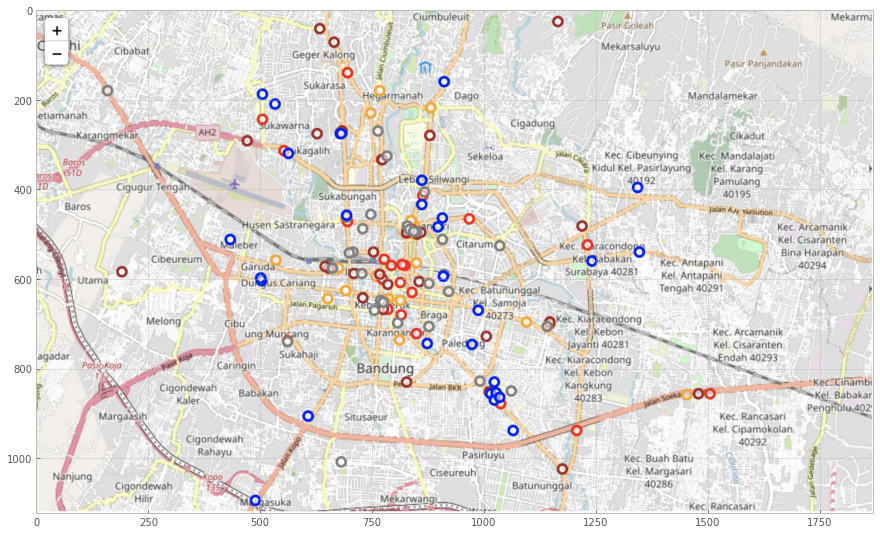

In [702]:
# Folium map won't render on github, so this is the png to see how the map looks like.
plt.figure(figsize=(15,15))
plt.imshow(mpimg.imread('ff_map.png'))

This shows how the corresponding fast food franchises distributed across the city. There are 5 different colors which are <span style="color:orange">***orange***</span>, <span style="color:red">***red***</span>, <span style="color:brown">***brown***</span>, <span style="color:#778899">***grey***</span>, and <span style="color: blue">***blue***</span> for **McDonald's**, **KFC**, **Burger King**, **Pizza Hut**, and **Domino's Pizza** respectively.

In [584]:
# concatenate all fastfood df
ff_df = pd.concat(df_dict.values())
ff_df.head(2)

,name,categories,address,crossStreet,lat,lng,labeledLatLngs,distance,postalCode,cc,city,state,country,formattedAddress,id,franchise_name
0,McDonald's,Fast Food Restaurant,Parking Lot IP,Jl. Pasirkaliki No. 121-123,-6.906203,107.597396,"[{'label': 'display', 'lat': -6.90620277481284...",1524,40162,ID,Bandung,Jawa Barat,Indonesia,"[Parking Lot IP (Jl. Pasirkaliki No. 121-123),...",4be37791fe299521e096966c,McDonald
1,McDonald's,Restaurant,Dalem Kaum,Bandung,-6.921311,107.605525,"[{'label': 'display', 'lat': -6.92131063283468...",425,NaN,ID,NaN,NaN,Indonesia,[Dalem Kaum (Bandung)],51417639e4b0e1e3894aa282,McDonald


In [703]:
# turn ff_df into geo dataframe
ff_gdf = gpd.GeoDataFrame(
    ff_df, geometry=gpd.points_from_xy(ff_df.lng, ff_df.lat))

Now we merge franchises data with our prior dataframe using spatial join. Spatial join will grouped the fast food franchises based on the franchises coordinates points which are located inside the polygon of sub-district

In [589]:
df_merged = gpd.sjoin(geo_df, ff_gdf,  how='left', op='contains')

In [590]:
df_merged.shape

(156, 31)

In [591]:
## count for fast food franchise in each sub_district
count = df_merged.groupby(['sub_district'])['FID'].count().to_frame().rename(columns = {'FID':'counts'}).sort_values('counts', ascending = False)
count

,counts
sub_district,
SUMUR BANDUNG,28
LENGKONG,17
ANDIR,16
BANDUNG WETAN,16
CICENDO,12
REGOL,11
SUKAJADI,10
COBLONG,10
ASTANAANYAR,4


In [592]:
# Take only the important columns
df_new = df_merged[['sub_district', 'franchise_name', 'lat', 'lng']]

#combine with feature dataset df
df_new = pd.merge(df_new, df[['sub_district','population', 'area (Ha)', 'density (pop/ha)', 
                              'social_interaction', 'security', 'health', 
                              'spare_time','environment', 'occupation',
                             'income_happiness_index', 'education', 'average_monthly_income (IDR)']], on = 'sub_district',)

In [593]:
# let's do one hot encoding to sub_district
one_hot_df = pd.get_dummies(df_new[['franchise_name']], prefix="", prefix_sep="")

# add sub_district column back to dataframe
one_hot_df['sub_district'] = df_new['sub_district'] 

# move neighborhood column to the first column
fixed_columns = [one_hot_df.columns[-1]] + list(one_hot_df.columns[:-1])# + list(df_new.columns[4:])
one_hot_df= one_hot_df[fixed_columns]

# Get all other features
one_hot_df[list(df_new.columns[4:])] = df_new[list(df_new.columns[4:])]
one_hot_df

# Group the data based on the sub_district
df_group = one_hot_df.groupby('sub_district').mean().reset_index()

In [594]:
# now the data ready for clustering, we will use DBSCAN clustering to segment each sub_district
from sklearn.cluster import DBSCAN 
from scipy.cluster import hierarchy 
from scipy.spatial import distance_matrix 
from sklearn.metrics.pairwise import euclidean_distances
from sklearn.cluster import AgglomerativeClustering 
from sklearn.preprocessing import MinMaxScaler 

X = df_group.iloc[:,1:]
X = MinMaxScaler().fit_transform(X)
dist_matrix = euclidean_distances(X,X) 

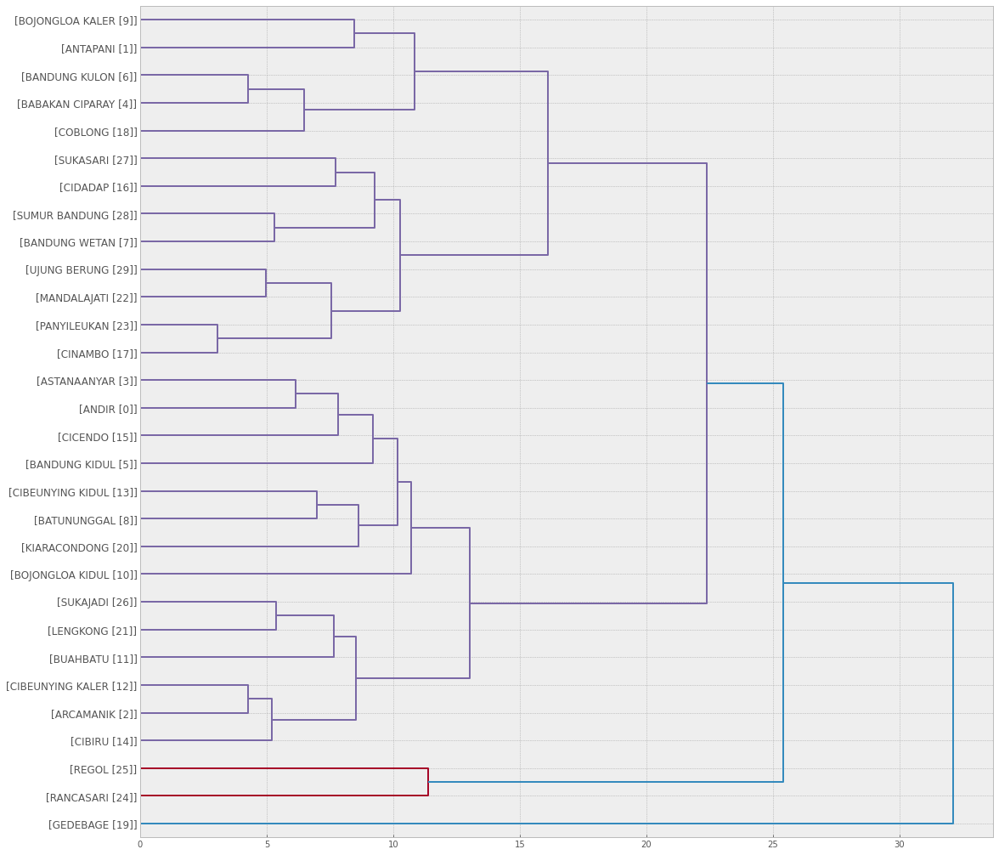

In [595]:
fig = plt.figure(figsize=(18,18))
def llf(id):
    return '[%s %s]' % (df_group['sub_district'][id], [id]) 
    
dendro = hierarchy.dendrogram(Z_using_dist_matrix, leaf_label_func=llf, leaf_rotation=0, leaf_font_size =12, orientation = 'right')

Now, we can use the 'AgglomerativeClustering' function from scikit-learn library to cluster the dataset. The AgglomerativeClustering performs a hierarchical clustering using a bottom up approach. The linkage criteria determines the metric used for the merge strategy:

-   Ward minimizes the sum of squared differences within all clusters. It is a variance-minimizing approach and in this sense is similar to the k-means objective function but tackled with an agglomerative hierarchical approach.
-   Maximum or complete linkage minimizes the maximum distance between observations of pairs of clusters.
-   Average linkage minimizes the average of the distances between all observations of pairs of clusters.


In [596]:
agglom = AgglomerativeClustering(n_clusters = 3, linkage = 'complete')
agglom.fit(dist_matrix)

agglom.labels_

array([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 2, 0, 0,
       1, 1, 0, 0, 0, 1, 1, 1])

In [597]:
df_group['cluster_'] = agglom.labels_ 

In [598]:
# now we got all the cluster for each district, we can plot the choropleth map to evaluate each cluster
# Determining the threshold scale
threshold_scale = np.linspace(df_group['cluster_'].min() ,
                              df_group['cluster_'].max(),
                              5, dtype=int)
threshold_scale = threshold_scale.tolist()
threshold_scale[-1] = threshold_scale[-1] + 0.001

# Create a map
m = folium.Map(location=[-6.9175, 107.6402], zoom_start=12)

# Add choropleth
folium.Choropleth(
    geo_data=geo_df,
    data=df_group[['sub_district', 'cluster_']],
    columns=['sub_district', 'cluster_'],
    key_on='feature.properties.sub_district',
    #threshold_scale=threshold_scale,
    fill_color='', 
    fill_opacity=0.9, 
    line_opacity=0.2,
    legend_name='Bandung Sub-District Environment Index',
    reset=True,
    highlight=True,
).add_to(m)

for key, val in df_dict.items():
    for lat, lng, label in zip(val.lat, val.lng, val.name):
        folium.CircleMarker(
            [lat, lng],
            radius=3,
            outline_width = 0.01,
            color=color_dict[key],
            popup=label,
            fill = True,
            fill_color='white',
            fill_opacity=0.6
        ).add_to(m)
    

m

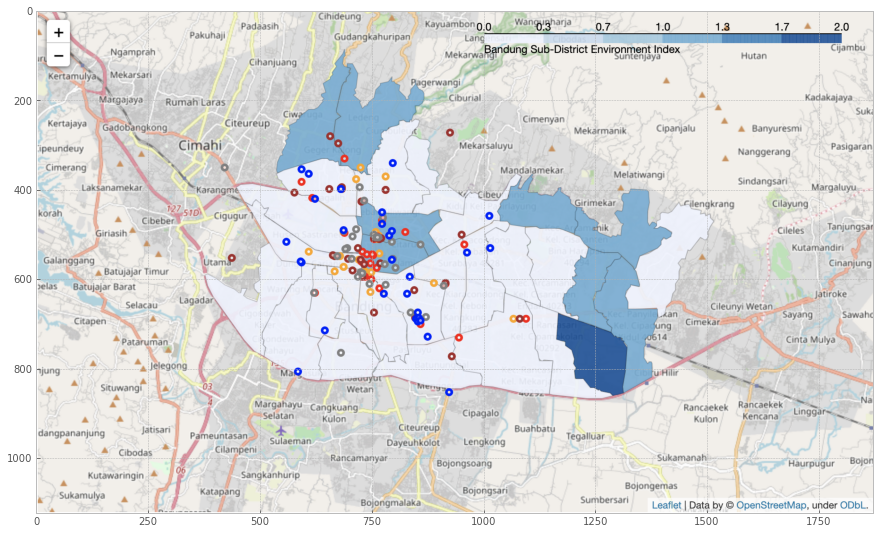

In [704]:
# Folium map won't render on github, so this is the png to see how the map looks like.
plt.figure(figsize=(15,15))
plt.imshow(mpimg.imread('cluster_map.png'))

We clearly see there are three cluster based on color of the area. The white cluster (**cluster 0**) dominating the city. Now we need to see which cluster is the best to place our franchise.

#### Evaluation

In [599]:
df_group.groupby(['cluster_', 'sub_district']).agg('mean')

Burger King  Domino's pizza       KFC  McDonald  \
cluster_ sub_district                                                        
0        ANDIR                0.250000        0.187500  0.062500  0.375000   
         ANTAPANI             0.000000        1.000000  0.000000  0.000000   
         ARCAMANIK            0.000000        0.000000  0.000000  0.000000   
         ASTANAANYAR          0.250000        0.000000  0.000000  0.250000   
         BABAKAN CIPARAY      0.000000        1.000000  0.000000  0.000000   
         BANDUNG KIDUL        1.000000        0.000000  0.000000  0.000000   
         BANDUNG KULON        0.000000        0.000000  0.000000  0.000000   
         BATUNUNGGAL          0.333333        0.000000  0.333333  0.000000   
         BOJONGLOA KALER      0.000000        0.333333  0.333333  0.000000   
         BOJONGLOA KIDUL      0.000000        0.000000  0.000000  0.000000   
         BUAHBATU             0.250000        0.000000  0.500000  0.250000   
         CIBEUNYING KALER     0.000000        0.000000  0.000000  0.000000   
         CIBEUNYING KIDUL     0.500000        0.500000  0.000000  0.000000   
         CIBIRU               0.000000        0.000000  0.000000  0.000000   
         CICENDO              0.166667        0.166667  0.166667  0.083333   
         COBLONG              0.200000        0.200000  0.200000  0.200000   
         KIARACONDONG         0.000000        0.500000  0.500000  0.000000   
         LENGKONG             0.117647        0.470588  0.117647  0.117647   
         RANCASARI            0.000000        0.000000  0.000000  0.000000   
         REGOL                0.181818        0.090909  0.181818  0.363636   
         SUKAJADI             0.400000        0.400000  0.200000  0.000000   
1        BANDUNG WETAN        0.125000        0.187500  0.125000  0.437500   
         CIDADAP              0.333333        0.000000  0.333333  0.333333   
         CINAMBO              0.000000        0.000000  0.000000  0.000000   
         MANDALAJATI          0.000000        0.000000  0.000000  0.000000   
         PANYILEUKAN          0.000000        0.000000  0.000000  0.000000   
         SUKASARI             1.000000        0.000000  0.000000  0.000000   
         SUMUR BANDUNG        0.107143        0.035714  0.392857  0.178571   
         UJUNG BERUNG         0.000000        0.000000  0.000000  0.000000   
2        GEDEBAGE             0.000000        0.000000  0.000000  0.000000   

                           Pizza Hut  population  area (Ha)  density (pop/ha)  \
cluster_ sub_district                                                           
0        ANDIR              0.125000       99378        422               235   
         ANTAPANI           0.000000       78817        422               187   
         ARCAMANIK          0.000000       76913        759               101   
         ASTANAANYAR        0.500000       74049        268               276   
         BABAKAN CIPARAY    0.000000      139374        707               197   
         BANDUNG KIDUL      0.000000       60129        542               111   
         BANDUNG KULON      0.000000      133275        695               192   
         BATUNUNGGAL        0.333333      121324        482               252   
         BOJONGLOA KALER    0.333333      123569        312               396   
         BOJONGLOA KIDUL    1.000000       86004        520               165   
         BUAHBATU           0.000000      101426        746               136   
         CIBEUNYING KALER   0.000000       69917        464               151   
         CIBEUNYING KIDUL   0.000000      113110        414               273   
         CIBIRU             0.000000       73114        684               107   
         CICENDO            0.416667       96413        779               124   
         COBLONG            0.200000      114665        731               157   
         KIARACONDONG       0.000000      130347        580             

In [601]:
# Average Happiness index Based on Different Aspects
hap_0 = df_group.loc[df_group['cluster_'] == 0].iloc[:,9:17].agg('mean')
hap_1 = df_group.loc[df_group['cluster_'] == 1].iloc[:,9:17].agg('mean')
hap_2 = df_group.loc[df_group['cluster_'] == 2].iloc[:,9:17].agg('mean')

compare_1 = pd.concat([hap_0, hap_1, hap_2], axis = 1)
compare_1.columns = ['Cluster 0', 'Cluster 1', 'Cluster 2']
compare_1  = compare_1
compare_1

,Cluster 0,Cluster 1,Cluster 2
social_interaction,75.500952,69.95125,64.98
security,78.250952,73.56875,70.05
health,76.191905,70.87625,64.01
spare_time,74.888095,68.64625,64.25
environment,78.650476,74.44375,68.84
occupation,74.154286,70.52500,63.29
income_happiness_index,72.140476,65.05000,56.76
education,71.978571,65.75500,60.63


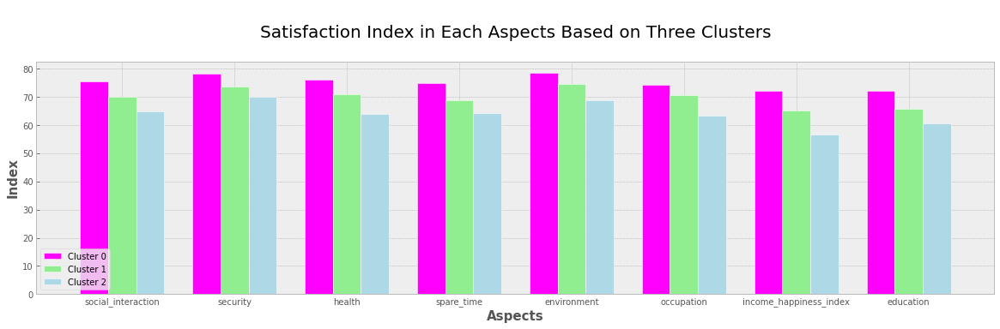

In [649]:
# now we need to see how the clusters compare each other.

# set width of bar
barWidth = 0.25

plt.figure(figsize = (20,5))
 
# Set position of bar on X axis
r1 = np.arange(len(compare_1))
r2 = [x + barWidth for x in r1]
r3 = [x + barWidth for x in r2]

# Make the plot
plt.bar(r1, compare_1['Cluster 0'], color='magenta', width=barWidth, edgecolor='white', label='Cluster 0')
plt.bar(r2, compare_1['Cluster 1'], color='lightgreen', width=barWidth, edgecolor='white', label='Cluster 1')
plt.bar(r3, compare_1['Cluster 2'], color='lightblue', width=barWidth, edgecolor='white', label='Cluster 2')
 
# Add xticks on the middle of the group bars
plt.xlabel("Aspects", size = 15, fontweight='bold')
plt.ylabel("Index", size = 15, fontweight='bold')
plt.title("\nSatisfaction Index in Each Aspects Based on Three Clusters\n", size = 20)
plt.xticks([r + barWidth for r in range(len(compare_1))], compare_1.index.tolist(),)# rotation = 90)
 
# Create legend & Show graphic
plt.legend(loc = 3)
plt.show()


Text(0.5, 1.0, '\nAverage Population in Each Clusters\n')

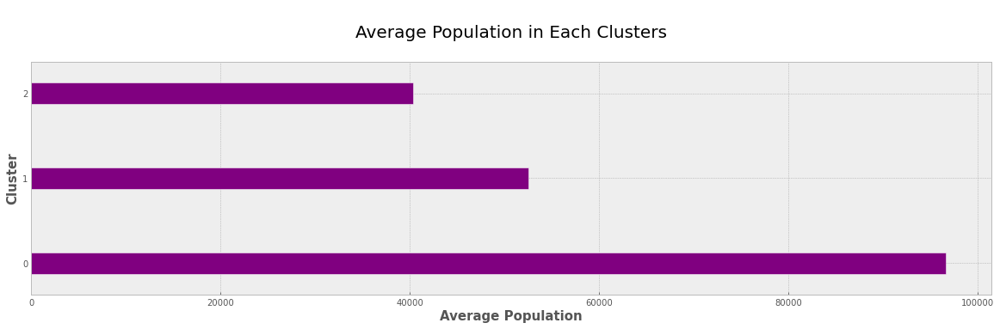

In [603]:
## Let's see the average population in each cluster

barWidth = 0.25

plt.figure(figsize = (20,5))
compare_2 = df_group.groupby(['cluster_'])['population'].agg('mean').to_frame()
compare_2['population'].plot(kind= 'barh', color='purple', width=barWidth, edgecolor='white')

plt.xlabel("Average Population", size = 15, fontweight='bold')
plt.ylabel("Cluster", size = 15, fontweight='bold')
plt.title("\nAverage Population in Each Clusters\n", size = 20)

Text(0.5, 1.0, '\nAverage Monthly Income (IDR) in Each Clusters\n')

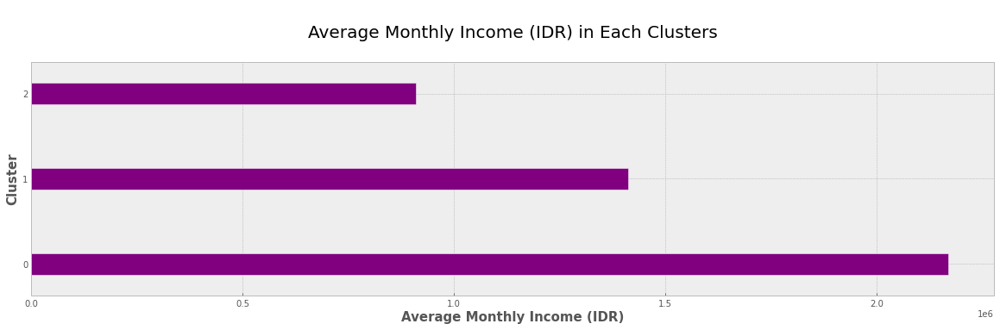

In [656]:
## Lastly we see the average monthly income of each cluster

barWidth = 0.25

plt.figure(figsize = (20,5))
compare_3 = df_group.groupby(['cluster_'])['average_monthly_income (IDR)'].agg('mean').to_frame()
compare_3['average_monthly_income (IDR)'].plot(kind= 'barh', color='purple', width=barWidth, edgecolor='white')

plt.xlabel("Average Monthly Income (IDR)", size = 15, fontweight='bold')
plt.ylabel("Cluster", size = 15, fontweight='bold')
plt.title("\nAverage Monthly Income (IDR) in Each Clusters\n", size = 20)

In [615]:
# We choose cluster 0 to place our franchise, now we can look at which district is preferable to be placed our franchise.
# We will look back at count dataframe and we take only cluster 0 and we take top 5 favorite place
favorite = count.loc[count.index.isin(df_group.loc[df_group['cluster_'] == 0]['sub_district'])].head()
favorite

,counts
sub_district,
LENGKONG,17
ANDIR,16
CICENDO,12
REGOL,11
SUKAJADI,10


In [706]:
# Create a map
m = folium.Map(location=[-6.920, 107.6602], zoom_start=13)

# Add choropleth
folium.Choropleth(
    geo_data=geo_df.loc[geo_df['sub_district'].isin(favorite.index)],
    #data =
    #columns=['sub_district', 'cluster_'],
    key_on='feature.properties.sub_district',
    #threshold_scale=threshold_scale,
    fill_color='lightblue', 
    fill_opacity=0.7, 
    line_opacity=0.2,
    legend_name='Bandung Sub-District Environment Index',
    reset=True,
    highlight=True,
).add_to(m)

for key, val in df_dict.items():
    for lat, lng, label in zip(val.lat, val.lng, val.name):
        folium.CircleMarker(
            [lat, lng],
            radius=1,
            outline_width = 0.01,
            color='blue',
            popup=label,
            fill = True,
            #fill_color='white',
            fill_opacity=0.6
        ).add_to(m)
        
for i in [[-6.9275, 107.6200],[-6.9375, 107.6107],[-6.9075, 107.6000],[-6.9132, 107.5823], [-6.8862, 107.5973]]:
    folium.CircleMarker(
        i,
        radius=5,
        color='red',
        popup='Best Possible Area',
        fill = True,
        fill_color = 'red',
        fill_opacity = 0.6
    ).add_to(m)

m

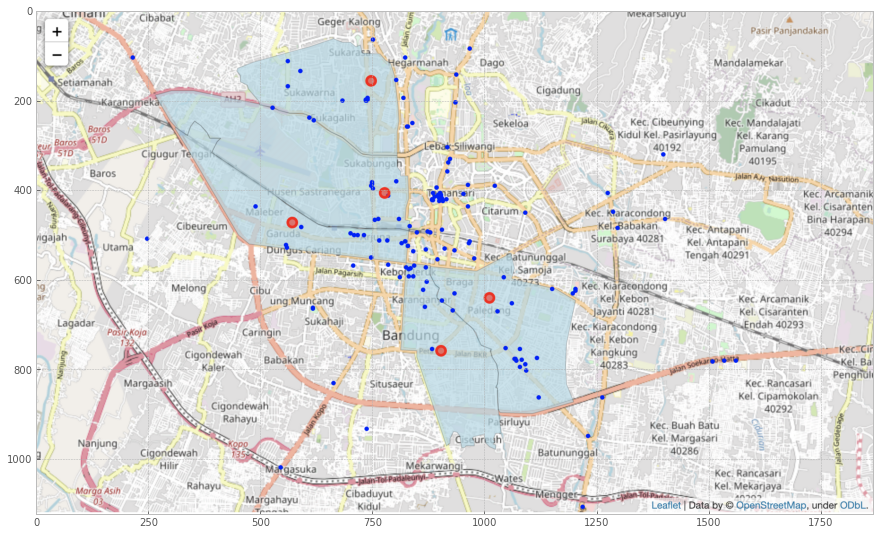

In [707]:
# Folium map won't render on github, so this is the png to see how the map looks like.
plt.figure(figsize=(15,15))
plt.imshow(mpimg.imread('final_map.png'))